## Install dependencies

In [1]:
!pip install pystac_client==0.6.1 stackstac==0.4.4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.5/169.5 kB 3.8 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 15.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.8/163.8 kB 21.1 MB/s eta 0:00:00
  Attempting uninstall: pystac
    Found existing installation: pystac 1.6.1
    Uninstalling pystac-1.6.1:
      Successfully uninstalled pystac-1.6.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
rastervision-core 0.20.3.dev0 requires geopandas==0.12.0, but you have geopandas 0.13.2 which is incompatible.
rastervision-core 0.20.3.dev0 requires imageio==2.22.1, but you have imageio 2.31.1 which is incompatible.
rastervision-core 0.20.3.dev0 requires numpy==1.23.3, but you have numpy 1.25.0 which is incompatible.
rastervision

---

In [20]:
import os

os.environ['AWS_ACCESS_KEY_ID'] = ''
os.environ['AWS_SECRET_ACCESS_KEY'] = ''
os.environ['AWS_SESSION_TOKEN'] = ''

In [146]:
import gc
from time import perf_counter

from rastervision.core.box import Box
from rastervision.core.data import (
    MinMaxTransformer, RasterioCRSTransformer, 
    StatsTransformer, XarraySource)
from rastervision.core.data.raster_source import XarraySource

from rastervision.pipeline.file_system.utils import download_if_needed, json_to_file, file_to_json
from rastervision.core.evaluation import ensure_json_serializable
from rastervision.core import RasterStats
from rastervision.core.data import Scene
from rastervision.pytorch_learner import (
    SemanticSegmentationRandomWindowGeoDataset,
    SemanticSegmentationSlidingWindowGeoDataset)

import math
from tqdm import tqdm
import numpy as np
from shapely.geometry import mapping
import torch
from torch.utils.data import DataLoader
from torchvision.transforms import Normalize
import albumentations as A

from matplotlib import pyplot as plt
import seaborn as sns
sns.reset_defaults()

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

---

## Get a time-series of Sentinel-2 images from a STAC API

Get Sentinel-2 imagery from 2023-06-01 to 2023-06-20 over Paris, France.

In [2]:
import pystac_client
import stackstac

https://en.wikipedia.org/wiki/2022_Pakistan_floods

In [3]:
bbox = Box(xmin=67.882, ymin=27.674, xmax=67.929, ymax=27.825)
# bbox_geometry = {'type': 'Polygon',
  # 'coordinates': (((bbox.xmin, bbox.ymin),
  #   (bbox.xmax, bbox.ymin),
  #   (bbox.xmax, bbox.ymax),
  #   (bbox.xmin, bbox.ymax),
  #   (bbox.xmin, bbox.ymin)),)}
bbox_geometry = mapping(bbox.to_shapely().oriented_envelope)
bbox_geometry

{'type': 'Polygon',
 'coordinates': (((67.88199999999998, 27.67399999999999),
   (67.92899999999999, 27.67399999999999),
   (67.92899999999999, 27.824999999999967),
   (67.88199999999998, 27.825000000000024),
   (67.88199999999998, 27.67399999999999)),)}

In [105]:
bbox = Box(xmin=-22.317357, ymin=63.914479, xmax=-22.219259, ymax=63.864181)
bbox_geometry = mapping(bbox.to_shapely().oriented_envelope)
bbox_geometry

{'type': 'Polygon',
 'coordinates': (((-22.31735700000001, 63.91447899999996),
   (-22.31735700000001, 63.86418099999996),
   (-22.219258999999983, 63.864181000000016),
   (-22.219258999999983, 63.914479000000014),
   (-22.31735700000001, 63.91447899999996)),)}

In [138]:
%%time

URL = "https://earth-search.aws.element84.com/v1"
catalog = pystac_client.Client.open(URL)

items = catalog.search(
    intersects=bbox_geometry,
    collections=["sentinel-2-l2a"],
    datetime="2017-01-01/2023-08-01",
    query={"eo:cloud_cover": {"lt": 10}},
).item_collection()
len(items)

CPU times: user 85.2 ms, sys: 3.82 ms, total: 89 ms
Wall time: 1.52 s


46

In [139]:
stack = stackstac.stack(items)
stack

<xarray.DataArray 'stackstac-61bbad464c429d53cb365a7e7c73eeca' (time: 46,
                                                                band: 32,
                                                                y: 10980,
                                                                x: 10980)>
dask.array<fetch_raster_window, shape=(46, 32, 10980, 10980), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/52)
  * time                                     (time) datetime64[ns] 2017-02-27...
    id                                       (time) <U24 'S2A_27VVL_20170227_...
  * band                                     (band) <U12 'aot' ... 'wvp-jp2'
  * x                                        (x) float64 4e+05 ... 5.098e+05
  * y                                        (y) float64 7.1e+06 ... 6.99e+06
    s2:nodata_pixel_percentage               (time) float64 5.326 ... 15.57
    ...                                       ...
    raster:bands                             (band) object [{'nodata': 0, 'da...
    gsd                                      (band) object None 10 ... None None
    common_name                              (band) object None 'blue' ... None
    center_wavelength                        (band) object None 0.49 ... None
    full_width_half_max                      (band) object None 0.098 ... None
    epsg                                     int64 32627
Attributes:
    spec:        RasterSpec(epsg=32627, bounds=(399960.0, 6990240.0, 509760.0...
    crs:         epsg:32627
    transform:   | 10.00, 0.00, 399960.00|\n| 0.00,-10.00, 7100040.00|\n| 0.0...
    resolution:  10.0

### Convert to a Raster Vision `RasterSource`

In [140]:
crs_transformer = RasterioCRSTransformer(
    transform=stack.transform, image_crs=stack.crs)

In [148]:
data_array = stack
data_array = data_array.sel(
    band=[
        'coastal', # B01
        'blue', # B02
        'green', # B03
        'red', # B04
        'rededge1', # B05
        'rededge2', # B06
        'rededge3', # B07
        'nir', # B08
        'nir08', # B8A
        'nir09', # B09
        'scl', # B11
        'swir16', # B11
        'swir22', # B12
    ])

In [149]:
valid_ts, _ = np.where(~np.isnan(data_array.isel(x=0, y=0, band=[0]).to_numpy()))
data_array = data_array.isel(time=valid_ts)
data_array

<xarray.DataArray 'stackstac-61bbad464c429d53cb365a7e7c73eeca' (time: 46,
                                                                band: 13,
                                                                y: 10980,
                                                                x: 10980)>
dask.array<getitem, shape=(46, 13, 10980, 10980), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/52)
  * time                                     (time) datetime64[ns] 2017-02-27...
    id                                       (time) <U24 'S2A_27VVL_20170227_...
  * band                                     (band) <U12 'coastal' ... 'swir22'
  * x                                        (x) float64 4e+05 ... 5.098e+05
  * y                                        (y) float64 7.1e+06 ... 6.99e+06
    s2:nodata_pixel_percentage               (time) float64 5.326 ... 15.57
    ...                                       ...
    raster:bands                             (band) object None None ... None
    gsd                                      (band) object 60 10 10 ... 20 20
    common_name                              (band) object 'coastal' ... 'swi...
    center_wavelength                        (band) object 0.443 0.49 ... 2.19
    full_width_half_max                      (band) object 0.027 0.098 ... 0.242
    epsg                                     int64 32627
Attributes:
    spec:        RasterSpec(epsg=32627, bounds=(399960.0, 6990240.0, 509760.0...
    crs:         epsg:32627
    transform:   | 10.00, 0.00, 399960.00|\n| 0.00,-10.00, 7100040.00|\n| 0.0...
    resolution:  10.0

### Create the `RasterSource`

In [115]:
raster_source_stats = XarraySource(
    data_array.isel(time=[0]),
    crs_transformer=crs_transformer,
    channel_order=list(range(len(data_array.band))),
    # bbox=crs_transformer.map_to_pixel(Box(*bbox)).normalize(),
    temporal=True
)
stats_tf = StatsTransformer.from_raster_sources([raster_source_stats], sample_prob=0.01)

Analyzing chips: 0it [00:00, ?it/s]

In [16]:
stats = RasterStats()
stats.means = stats_tf.means
stats.stds = stats_tf.stds
stats.save('42RUR_L1C_stats.json')

In [150]:
raster_source = XarraySource(
    data_array,
    crs_transformer=crs_transformer,
    raster_transformers=[stats_tf],
    channel_order=list(range(len(data_array.band))),
    bbox=crs_transformer.map_to_pixel(Box(*bbox)).normalize(),
    temporal=True
)
raster_source.shape

(46, 570, 470, 13)

Visualize the images in the time-series:

In [144]:
T = raster_source.shape[0]
t_strs = np.array([str(_t.date()) for _t in raster_source.data_array.time.to_series().to_list()])

100%|███████████████████████████████████████████████████████████████████████████████████| 46/46 [01:19<00:00,  1.72s/it]


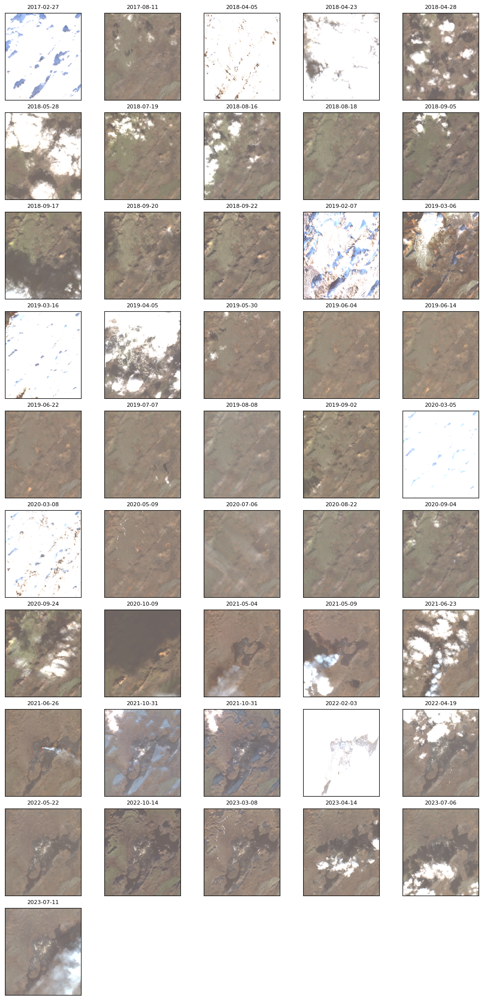

In [147]:
window = Box(30, 0, 570, 470)

plt.close('all')
ncols = 5
nrows = int(math.ceil(T / ncols))
fig, axs = plt.subplots(
    nrows, ncols, figsize=(ncols * 2, nrows * 2), constrained_layout=True)
with tqdm(zip(range(T), t_strs, axs.flat), total=T) as bar:
    for t, t_str_t, ax in bar:
        chip_t = raster_source.get_chip(window, bands=[3, 2, 1], time=t)
        ax.imshow(chip_t)
        ax.tick_params(top=False, bottom=False, left=False, right=False,
                    labelleft=False, labelbottom=False, labeltop=False)
        ax.set_title(t_str_t, fontsize=8)

if t < len(axs.flat) - 1:
    for ax in axs.flat[t + 1:]:
        ax.axis('off')
plt.show()

100%|███████████████████████████████████████████████████████████████████████████████████| 46/46 [00:26<00:00,  1.75it/s]


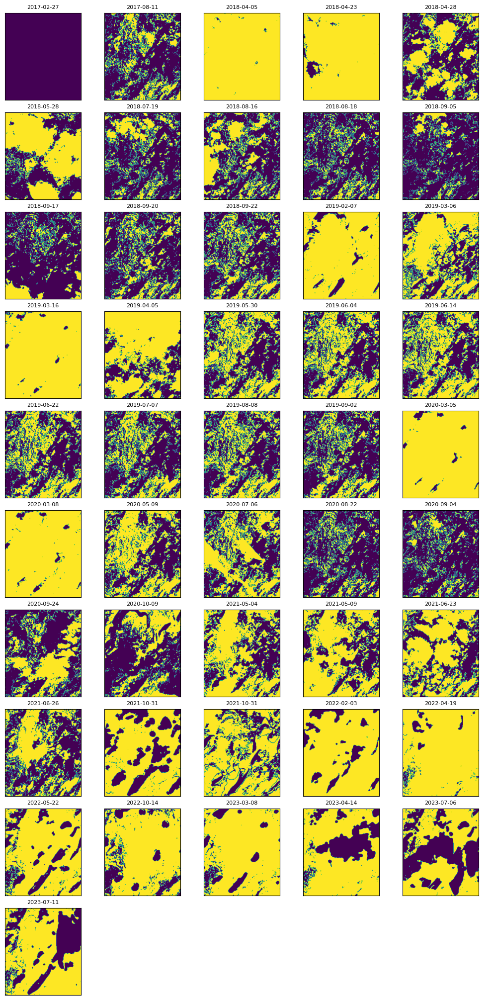

In [151]:
window = Box(30, 0, 570, 470)

plt.close('all')
ncols = 5
nrows = int(math.ceil(T / ncols))
fig, axs = plt.subplots(
    nrows, ncols, figsize=(ncols * 2, nrows * 2), constrained_layout=True)
with tqdm(zip(range(T), t_strs, axs.flat), total=T) as bar:
    for t, t_str_t, ax in bar:
        chip_t = raster_source.get_chip(window, bands=[10], time=t).squeeze()
        ax.imshow(chip_t)
        ax.tick_params(top=False, bottom=False, left=False, right=False,
                    labelleft=False, labelbottom=False, labeltop=False)
        ax.set_title(t_str_t, fontsize=8)

if t < len(axs.flat) - 1:
    for ax in axs.flat[t + 1:]:
        ax.axis('off')
plt.show()

In [152]:
np.unique(chip_t)

array([113, 114], dtype=uint8)

---

## Get model

https://github.com/zhu-xlab/SSL4EO-S12

MoCo	ResNet18	S2-L1C 13 bands

In [22]:
from torch import nn
from torchvision.models import resnet18

In [25]:
from rastervision.pytorch_learner.utils import adjust_conv_channels

In [9]:
sd = torch.load('./B13_rn18_moco_0099_ckpt.pth')

In [ ]:
sd_encoder_q = {k: v for k, v in sd['state_dict'].items() if (k.startswith('module.encoder_q') and not '.fc.' in k)}
sd_encoder_q_no_prefix = {k.replace('module.encoder_q.', ''): v for k, v in sd_encoder_q.items()}
# sd_encoder_q_no_prefix.keys()

In [144]:
model = resnet18(weights=None)
model.fc = nn.Identity()
model.conv1 = adjust_conv_channels(model.conv1, 13, pretrained=False)
model.load_state_dict(sd_encoder_q_no_prefix)
model = model.to(device=DEVICE)
model = model.eval()

In [237]:
# # model = resnet18(weights='DEFAULT')
# model = resnet50(weights='DEFAULT')
# model.fc = nn.Identity()
# model = model.to(device=DEVICE)
# model = model.eval()

In [27]:
# tf = Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))

---

In [119]:
model_weights_path = 'https://s3.amazonaws.com/azavea-research-public-data/raster-vision/examples/tutorials-data/temporal/pretrained-resnet18-weights.pth'
model = torch.hub.load(
    'AdeelH/geospatial-time-series:rv-demo',
    'SeriesResNet18',
    source='github',
    trust_repo=False,
)
model.load_state_dict(
    torch.hub.load_state_dict_from_url(model_weights_path))
model = model.to(device=DEVICE)
model = model.eval()

The repository AdeelH_geospatial-time-series does not belong to the list of trusted repositories and as such cannot be downloaded. Do you trust this repository and wish to add it to the trusted list of repositories (y/N)? y


The repository is already trusted.


Downloading: "https://github.com/AdeelH/geospatial-time-series/zipball/rv-demo" to /root/.cache/torch/hub/rv-demo.zip
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████████████████████████████████████████████████████████████████████████| 44.7M/44.7M [00:01<00:00, 25.3MB/s]
Downloading: "https://s3.amazonaws.com/azavea-research-public-data/raster-vision/examples/tutorials-data/temporal/pretrained-resnet18-weights.pth" to /root/.cache/torch/hub/checkpoints/pretrained-resnet18-weights.pth
100%|██████████████████████████████████████████████████████████████████████████████| 45.8M/45.8M [00:01<00:00, 27.3MB/s]


---

## Run inference

In [30]:
from tqdm import tqdm, trange
import numpy as np

In [149]:
raster_source_ds = XarraySource(
    data_array.isel(time=valid_ts),
    crs_transformer=crs_transformer,
    raster_transformers=[stats_tf],
    channel_order=list(range(len(data_array.band))),
    bbox=crs_transformer.map_to_pixel(Box(*bbox)).normalize(),
    temporal=True
)
raster_source_ds.shape

(139, 1668, 478, 13)

In [80]:
stats_tf.means

array([ 763.63777778,  933.13592222, 1170.95694444, 1318.20361111,
       1578.31933333, 1822.41946667, 1947.44586667, 2140.88942222,
       2095.0408    , 2190.14431111,    6.31395556, 2044.73697778,
       1460.26933333])

In [150]:
raster_source_viz = XarraySource(
    data_array.sel(band=['red', 'green', 'blue']).isel(time=valid_ts),
    crs_transformer=crs_transformer,
    raster_transformers=[StatsTransformer(means=stats_tf.means[[3, 2, 1]], stds=stats_tf.stds[[3, 2, 1]])],
    bbox=crs_transformer.map_to_pixel(Box(*bbox)).normalize(),
    temporal=True
)

In [122]:
def get_embeddings(model, x, batch_size=16):
    embeddings = []
    with torch.inference_mode():
        _x = x.to(device=DEVICE)
        for i in trange(0, len(x), batch_size):
            _x_batch = _x[i: i + batch_size]
            # _x_batch = tf(_x_batch)
            out = model(_x_batch)
            embeddings.append(out.cpu().numpy())
    embeddings = np.concatenate(embeddings)
    return embeddings

def get_embeddings_rs(model, rs, window, batch_size=8):
    embeddings = []
    T = rs.shape[0]
    for i in trange(0, T, batch_size):
        x = rs.get_chip(window, time=slice(i, i + batch_size))
        x = torch.from_numpy(x).float().permute(0, 3, 1, 2)
        embeddings.append(get_embeddings(model, x))
    embeddings = np.concatenate(embeddings)
    return embeddings

def get_embeddings_rs_temporal_model(model, rs, window, batch_size=8):
    embeddings = []
    T = rs.shape[0]
    for i in trange(0, T, batch_size):
        x = rs.get_chip(window, time=slice(i, i + batch_size))
        x = torch.from_numpy(x).float().permute(0, 3, 1, 2)
        with torch.inference_mode():
            _x = x.to(device=DEVICE).unsqueeze(0)
            out = model(_x)
            embeddings.append(out.cpu().numpy())
    embeddings = np.concatenate(embeddings)
    return embeddings

In [151]:
window = Box(ymin=1200, xmin=0, ymax=1600, xmax=400)
# embeddings = get_embeddings_rs_temporal_model(model, raster_source_ds, window, batch_size=8)
embeddings = get_embeddings_rs(model, raster_source_ds, window, batch_size=16)
embeddings.shape

100%|█████████████████████████████████████████████████████████████████████████████████████| 9/9 [03:14<00:00, 21.65s/it]


(139, 512)

In [50]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

In [175]:
kmeans = KMeans(12)
kmeans_res = kmeans.fit(embeddings)

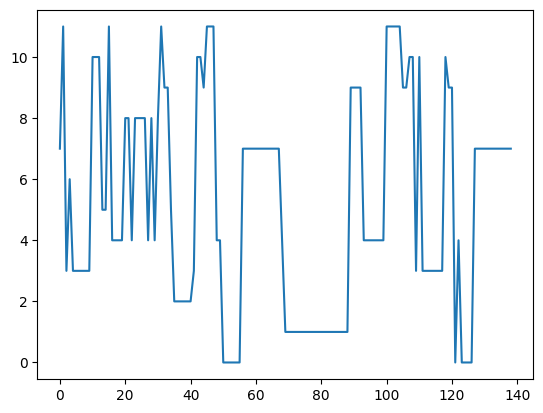

In [176]:
cs = kmeans_res.predict(embeddings)
plt.plot(cs)
plt.show()

In [184]:
mean_intra_cluster_distances = np.zeros((len(np.unique(cs)), ))
for c in np.unique(cs):
    mask = cs == c
    c_centroid = kmeans.cluster_centers_[c]
    c_embeddings = embeddings[mask]
    dists = np.sqrt((c_embeddings - c_centroid)**2).sum(axis=-1)
    mean_dist = dists.mean()
    mean_intra_cluster_distances[c] = mean_dist
mean_intra_cluster_distances

array([3.20165634e+01, 3.06275482e+01, 2.13492184e+01, 2.53117275e+01,
       3.38585510e+01, 4.97091675e+01, 9.37879577e-06, 3.10343781e+01,
       2.45370884e+01, 3.47232819e+01, 3.12779274e+01, 2.94071980e+01])

In [177]:
np.where(cs == 1)

(array([69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85,
        86, 87, 88]),)

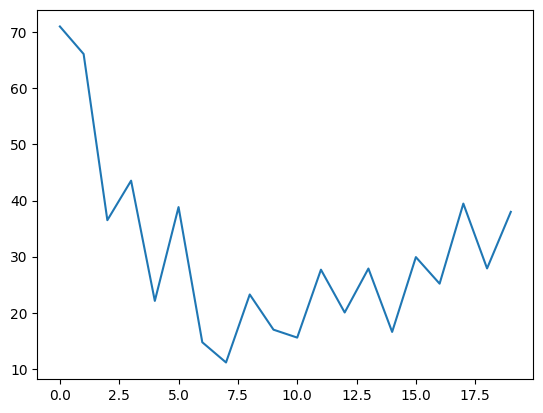

In [182]:
mask = cs == 1
embeddings_c = embeddings[mask]
# diffs = np.abs(embeddings_c - kmeans.cluster_centers_[1]).mean(axis=-1)
diffs = np.sqrt((embeddings_c - kmeans.cluster_centers_[1])**2).sum(axis=-1)
plt.plot(diffs)
plt.show()

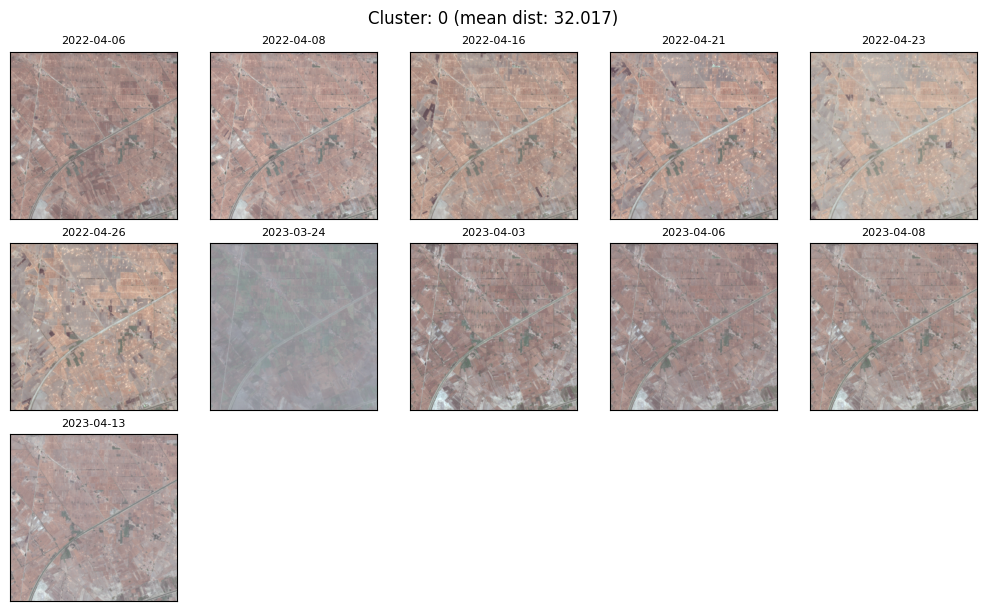

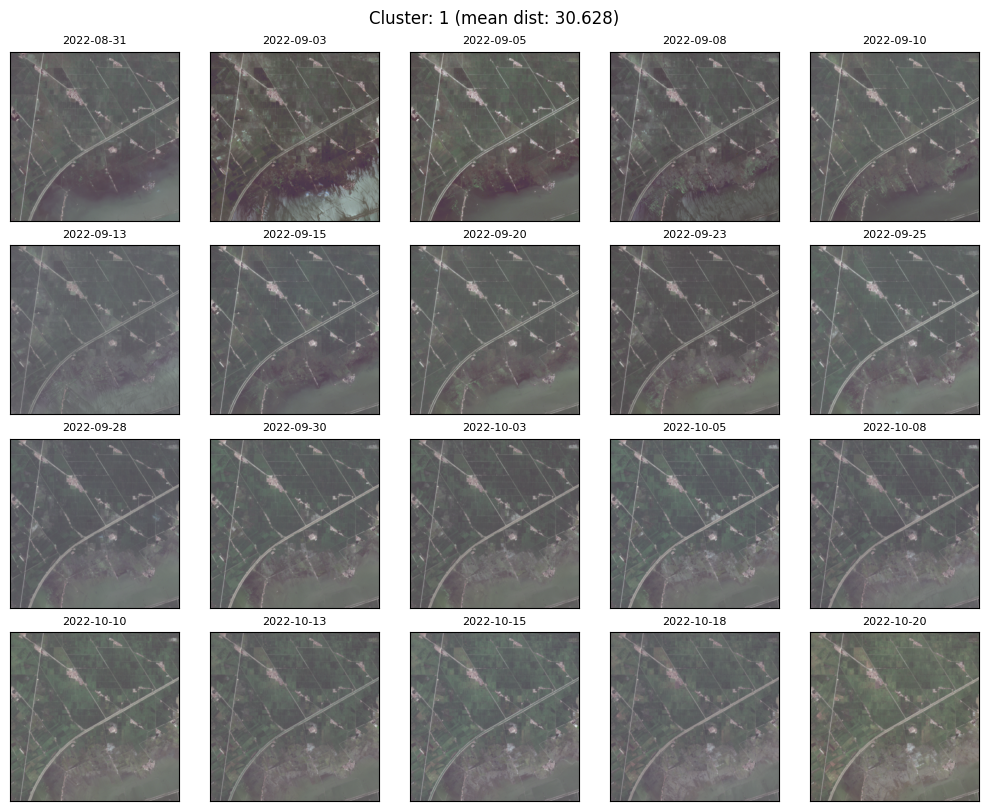

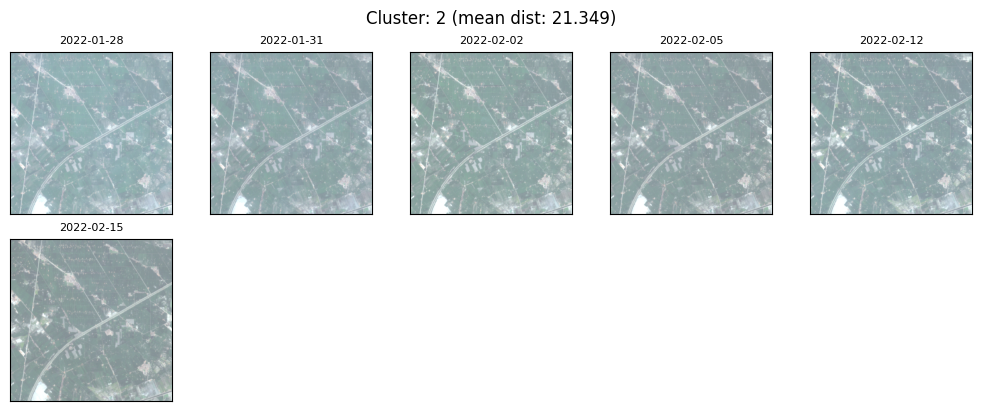

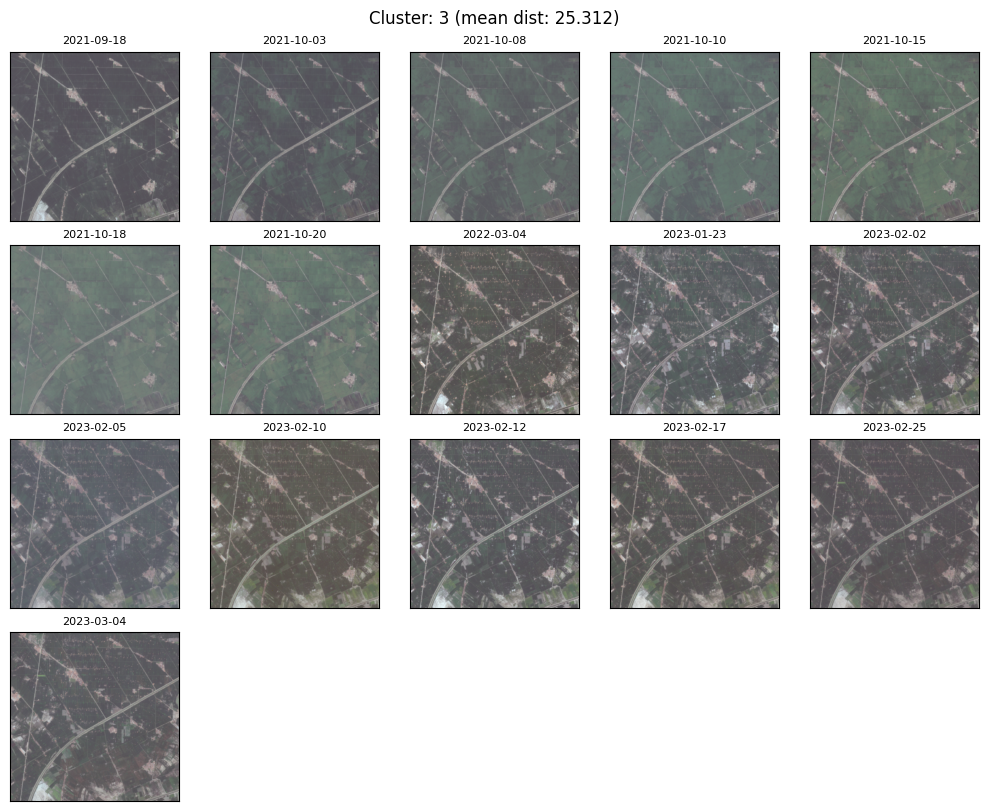

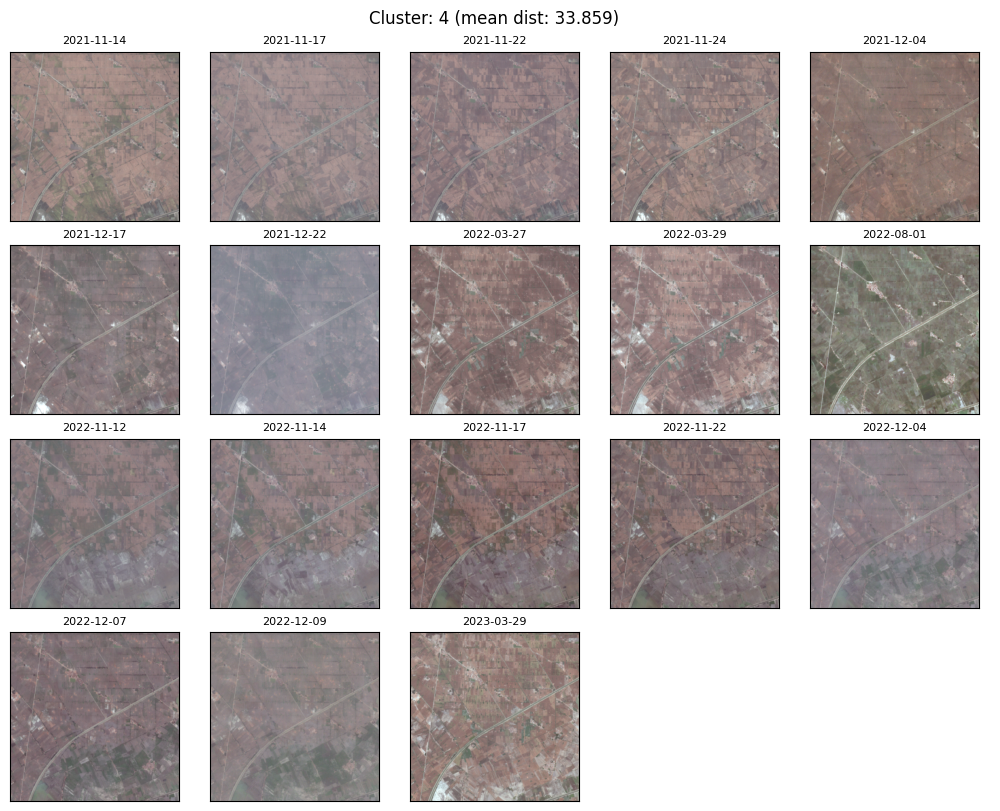

...

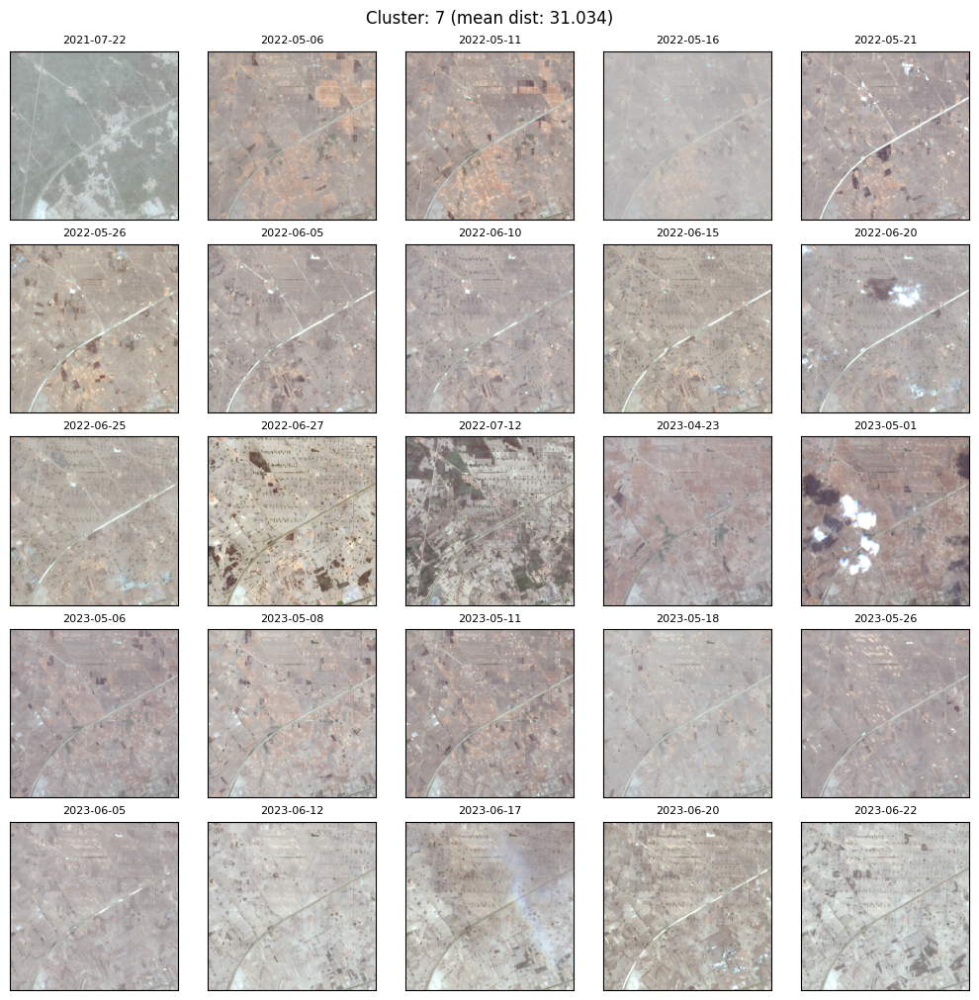

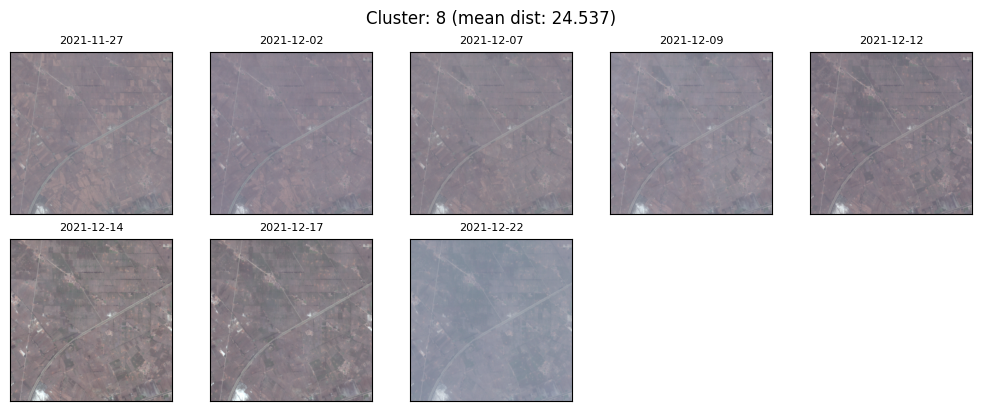

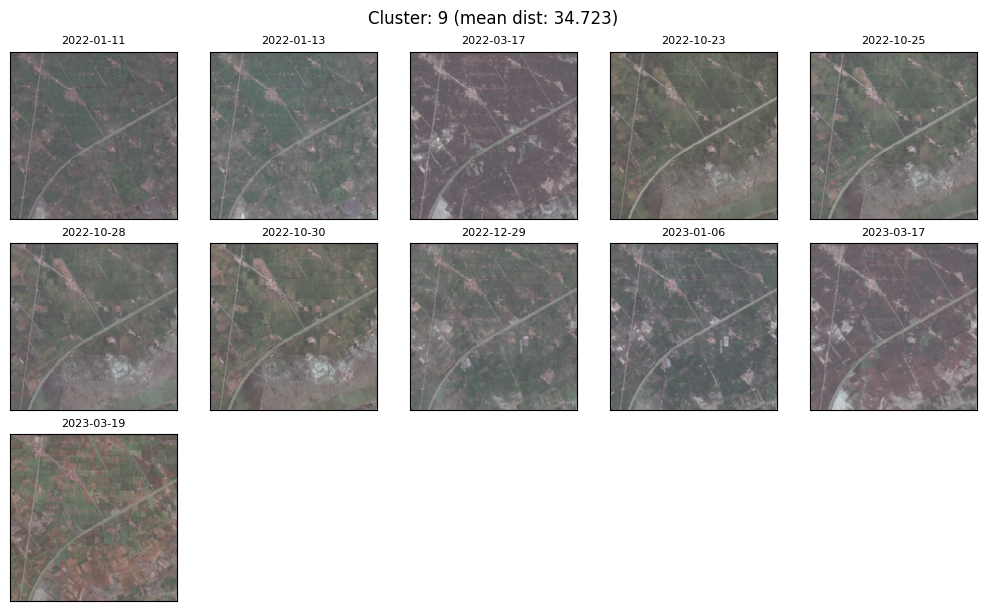

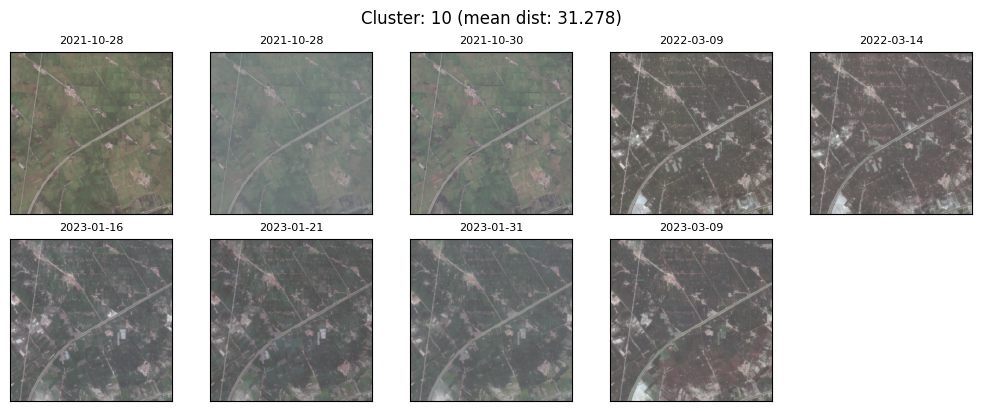

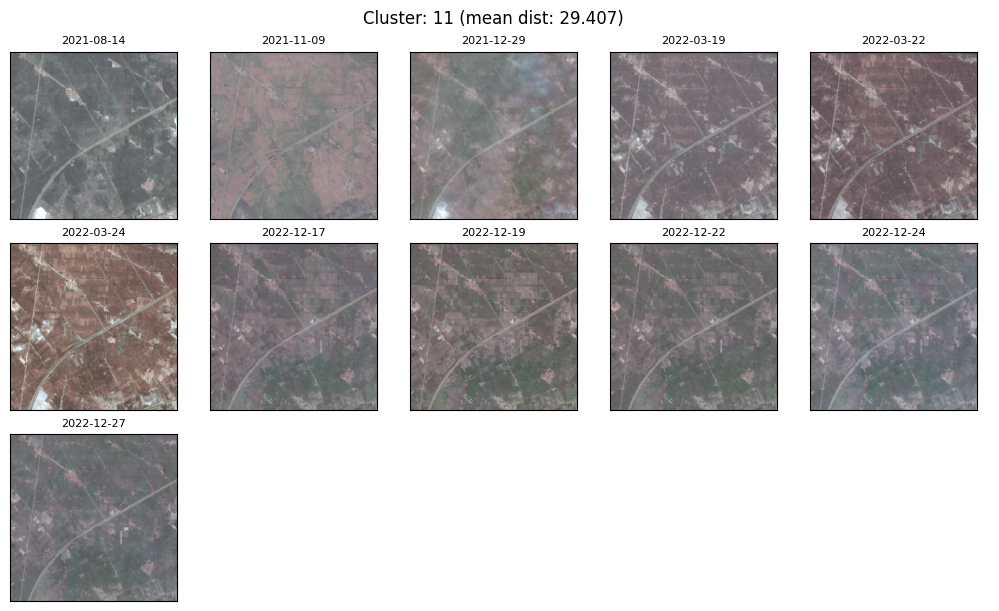

In [185]:
plt.close('all')
imgs_per_cluster = 30
for c in np.unique(cs):
    mask = cs == c
    _chip = raster_source_viz.get_chip(window, time=np.where(mask)[0][:imgs_per_cluster])
    _t_strs = t_strs[valid_ts[mask]][:imgs_per_cluster]

    ncols = 5
    nrows = int(math.ceil(len(_chip) / ncols))
    fig, axs = plt.subplots(
        nrows, ncols, figsize=(ncols * 2, nrows * 2), constrained_layout=True)
    fig.suptitle(f'Cluster: {c} (mean dist: {mean_intra_cluster_distances[c]:.3f})')
    for i, (_chip_t, ax, _t_str_t) in enumerate(zip(_chip, axs.flat, _t_strs)):
        ax.imshow(_chip_t)
        ax.tick_params(top=False, bottom=False, left=False, right=False,
                    labelleft=False, labelbottom=False, labeltop=False)
        ax.set_title(_t_str_t, fontsize=8)
    if i < len(axs.flat) - 1:
        for ax in axs.flat[i + 1:]:
            ax.axis('off')
    plt.show()


---